In [2]:
!pip install -q ultralytics albumentations

# Fine-tuning

In [ ]:
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
from ultralytics import YOLO

In [ ]:
model = YOLO("/kaggle/input/yolo11x-mix/pytorch/default/1/best.pt")

In [ ]:
train_config = {
    "data": "/kaggle/input/school-notebooks-dataset-yolo/data.yaml", # paste your YAML config
    "batch": 32,
    "epochs": 50,
    "patience": 20,
    "lr0": 1e-4,
    "optimizer": "AdamW",
    "cos_lr": True,
    "dropout": 0.1,
    "device": [0, 1],
    "exist_ok": True,
}

In [ ]:
fine_tune_config = {
    "data": "/kaggle/input/dialectic-real-yolo/data.yaml", # paste your YAML config
    "batch": 32,
    "epochs": 100,
    "patience": 20,
    "lr0": 1e-5,
    "optimizer": "AdamW",
    "warmup_epochs": 5,
    "close_mosaic": 5,
    "freeze": 15,
    "device": [0, 1],
    "exist_ok": True
}

In [ ]:
model.train(**fine_tune_config) # paste the config (train or fine-tine)

In [ ]:
import os
import shutil


def create_zip(folder_to_zip, zip_path):
    base_name = zip_path[:-4]
    shutil.make_archive(base_name=base_name, format='zip', root_dir=folder_to_zip)
    folder_name = os.path.basename(folder_to_zip)
    print(f"Zip archive of the {folder_name} created")


zip_path = '/kaggle/working/yolo11x-dialectic.zip'
folder_to_zip = '/kaggle/working/runs'

if os.path.exists(zip_path):
    os.remove(zip_path)

create_zip(folder_to_zip, zip_path)

# Test

In [3]:
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [7]:
p = Path("/kaggle/input/dialectic-real-yolo/val/images") # paste the path with photos for testing
imgs = []

for file in p.rglob("*"):
    imgs.append(cv2.imread(file).copy())

In [8]:
# Load a trained detection model
model_detection = YOLO('/kaggle/input/yolo11x-dialectic/pytorch/default/1/best.pt') # paste the path to your trained model
result = model_detection.predict(source=imgs, conf=0.3)



0: 640x640 20 texts, 2462.5ms
1: 640x640 15 texts, 2462.5ms
2: 640x640 37 texts, 2462.5ms
3: 640x640 25 texts, 2462.5ms
4: 640x640 22 texts, 2462.5ms
5: 640x640 35 texts, 2462.5ms
6: 640x640 13 texts, 2462.5ms
7: 640x640 19 texts, 2462.5ms
8: 640x640 25 texts, 2462.5ms
9: 640x640 44 texts, 2462.5ms
10: 640x640 14 texts, 2462.5ms
Speed: 4.7ms preprocess, 2462.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


In [14]:
def yolo_test(result, imgs, i=0):    
    out_img = cv2.cvtColor(imgs[i], cv2.COLOR_BGR2RGB)
    
    for data in result[i].boxes.data.tolist():        
        xmin, ymin, xmax, ymax, _, _ = map(int, data)        
    
        cv2.rectangle(out_img, (xmin, ymin), (xmax, ymax), color=(0, 0, 255), thickness=3)
    
    plt.figure(figsize=(15, 10))
    plt.imshow(out_img)
    plt.axis('off')
    plt.show()
            

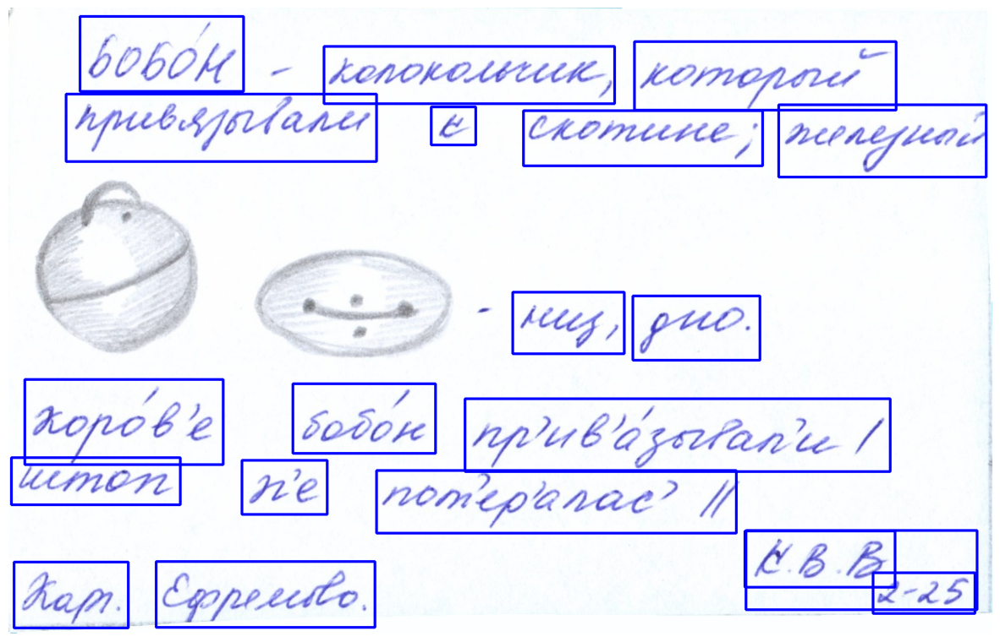

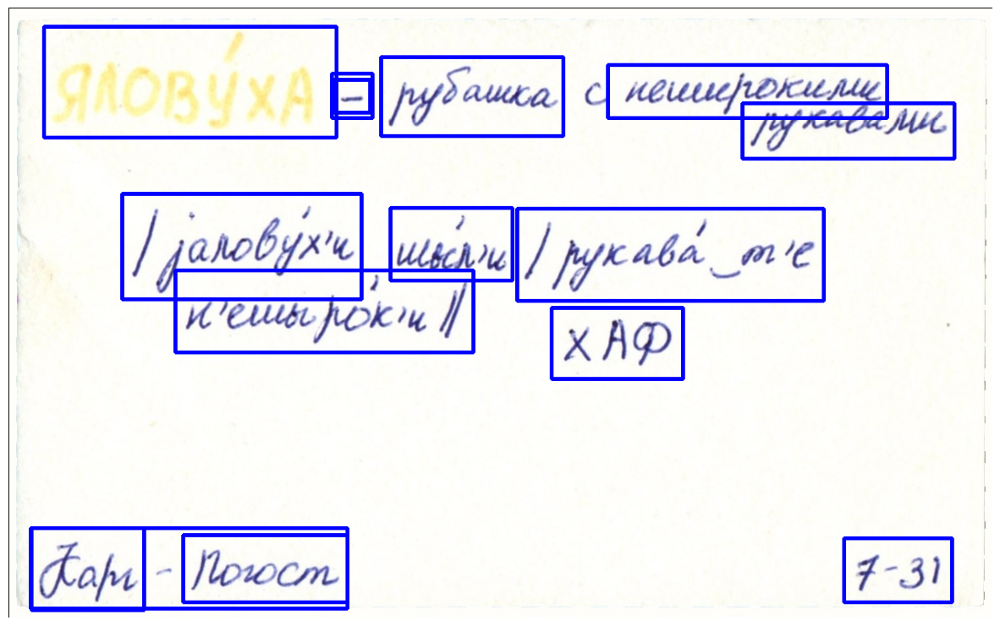

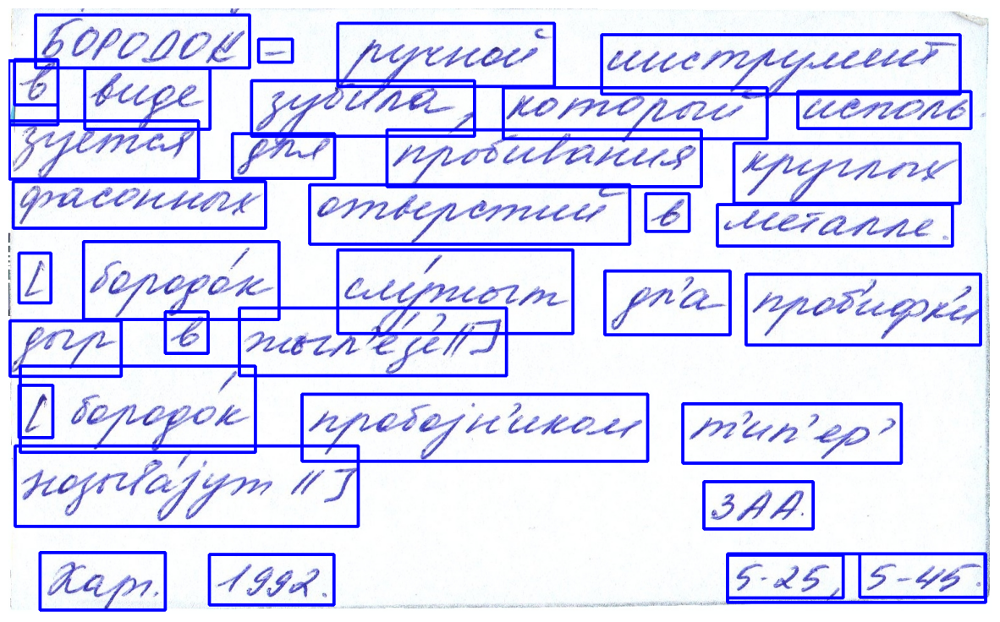

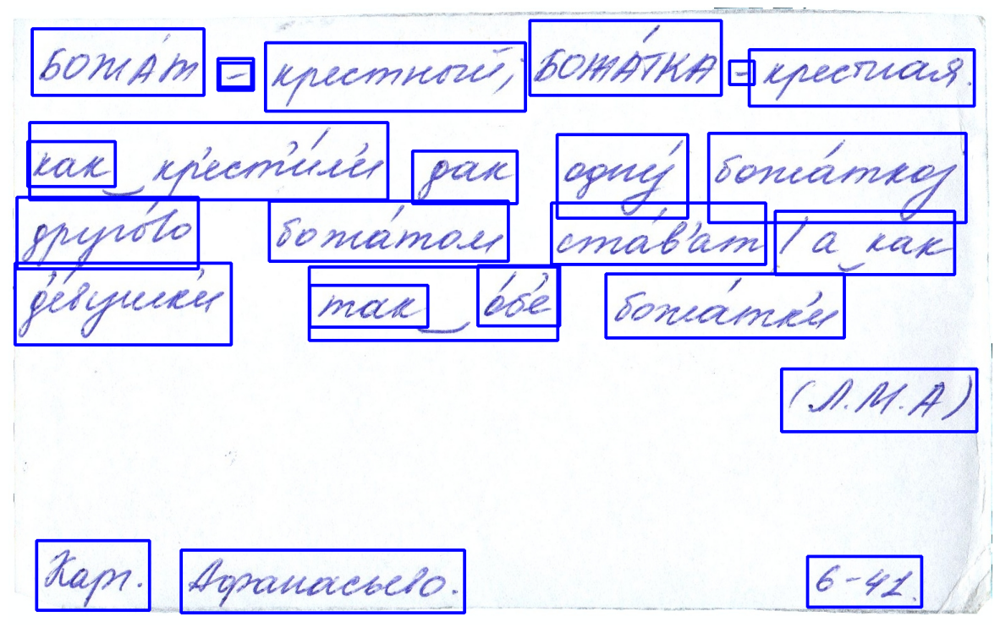

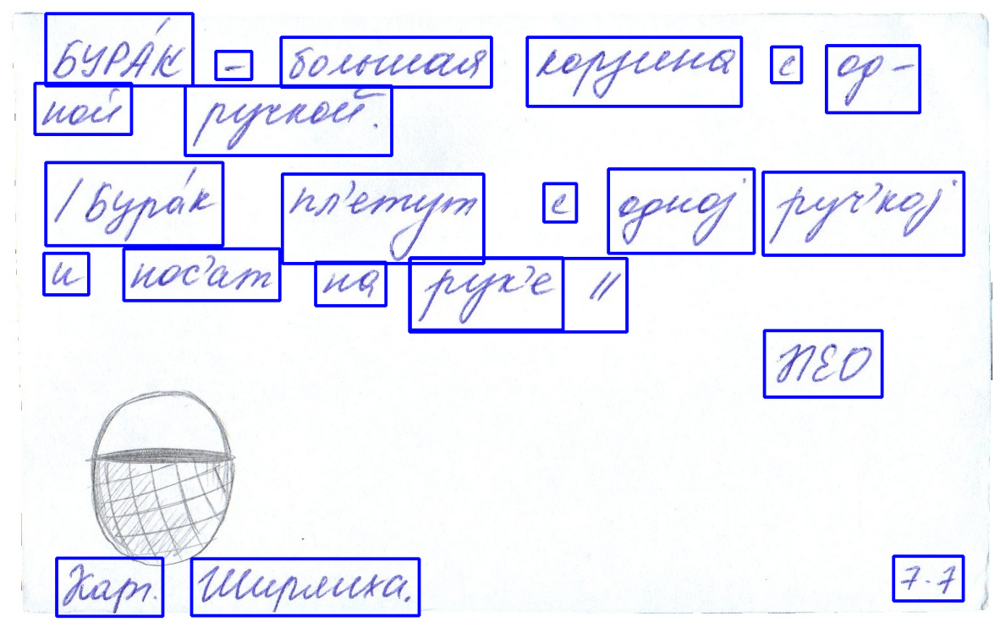

...

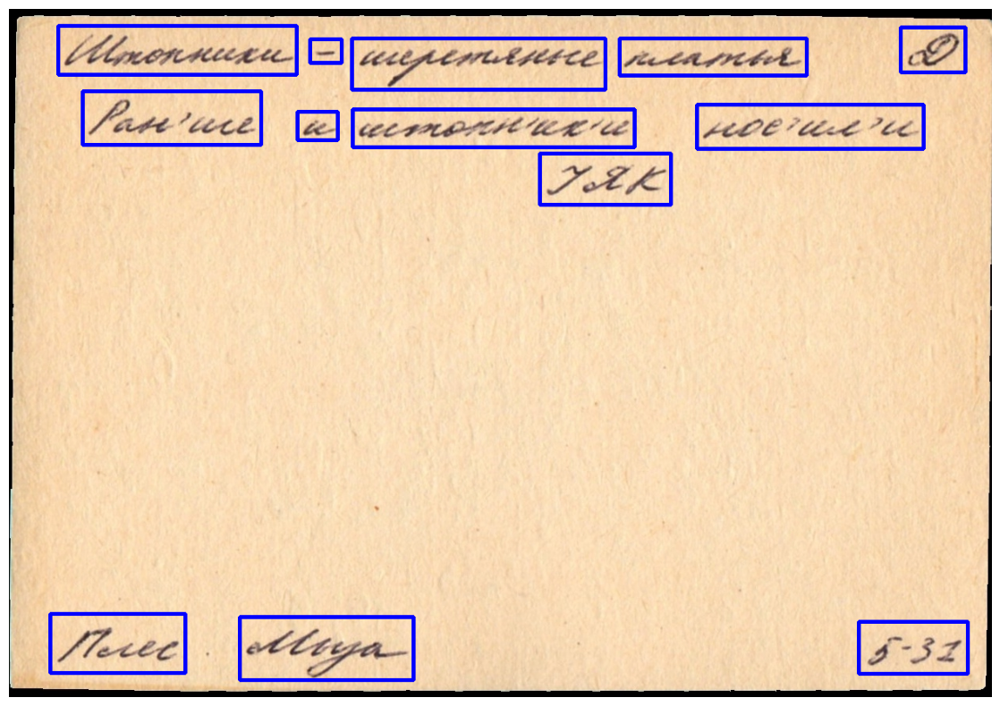

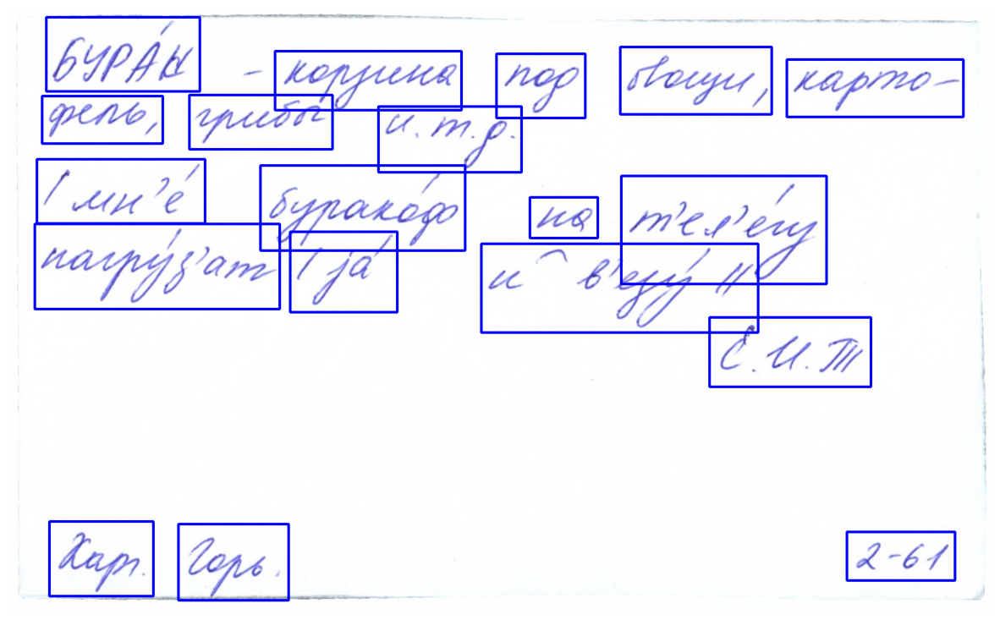

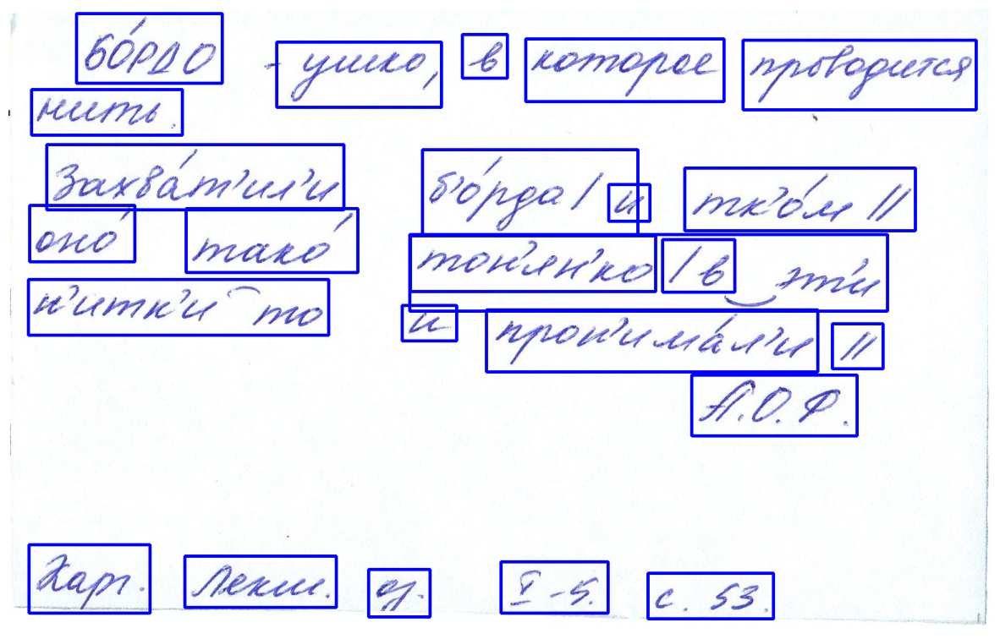

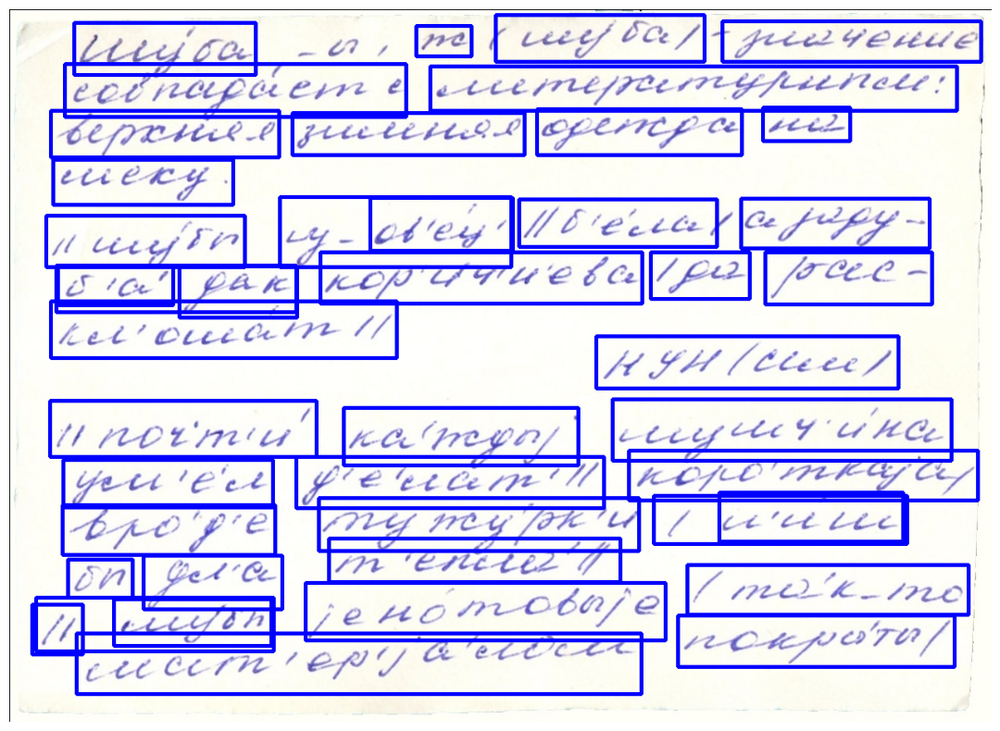

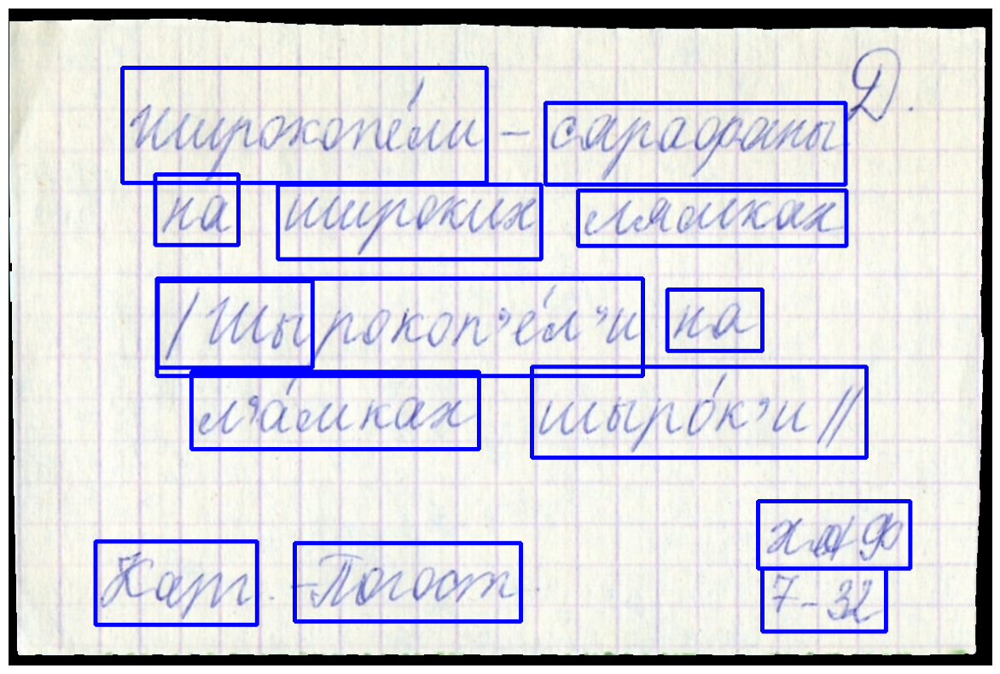

In [15]:
for i in range(len(imgs)):
    yolo_test(result, imgs, i)